<a href="https://colab.research.google.com/github/MehdiJmlkh/DLS25-HW5/blob/master/Direct_Ascent_Synthesis_generation_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
os._exit(0)


# Basic demo for Direct Ascent Synthesis (DAS)
This is a basic demo that showcases the key capabilities of the Direct Ascent Synthesis (DAS) method by Stanislav Fort and Jonathan Withaker described in the paper [Direct Ascent Synthesis: Revealing Hidden Generative Capabilities in Discriminative Models
](https://arxiv.org/abs/2502.07753) (https://arxiv.org/abs/2502.07753)

# Basic setup

In [ ]:
! pip install open_clip_torch
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

In [4]:
import clip
import torch
from PIL import Image
import open_clip
import tqdm
import matplotlib.pyplot as plt
from torch.optim import AdamW, Adam, SGD
import numpy as np
import torch.nn.functional as F
from torch.optim.lr_scheduler import CosineAnnealingLR, LambdaLR
from scipy import stats
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

device = "cuda" if torch.cuda.is_available() else "cpu"

# Getting the CLIP models

In [2]:
class CLIPModel:
    def __init__(self, model, tokenizer, preprocess, device='cuda'):
        self.model = model
        self.tokenizer = tokenizer
        self.mean = torch.Tensor(preprocess.transforms[-1].mean) \
                         .reshape([1, 3, 1, 1]) \
                         .to(device)
        self.std = torch.Tensor(preprocess.transforms[-1].std) \
                        .reshape([1, 3, 1, 1]) \
                        .to(device)

    def encode_text(self, texts):
        tokenized_text = self.tokenizer(texts).to(device)
        text_embeddings = self.model.encode_text(tokenized_text)
        return text_embeddings

    def encode_image(self, images):
        normalized_images = self.normalize_image(images)
        image_embeddings = self.model.encode_image(normalized_images)
        return image_embeddings

    def normalize_image(self, x):
        return (x - self.mean) / self.std

    def eval(self):
        self.model.eval()

In [5]:
models_to_load = [
    ("ViT-B-32", "laion400m_e32"),
    ("ViT-B-32", "laion2b_s34b_b79k"),
    ("OpenAI-ViT-B/32", None),
]

models = []
for model_name, pretrained in models_to_load:
    if pretrained is not None:  # openclip models
        model, _, preprocess = open_clip.create_model_and_transforms(
            model_name=model_name,
            pretrained=pretrained
        )

        tokenizer = open_clip.get_tokenizer(model_name)

    else:  # clip models
        model, preprocess = clip.load(model_name.split("OpenAI-")[1])

        tokenizer = clip.tokenize

    print(f"Loaded {model_name} {preprocess}")
    model.to(device)
    models.append(CLIPModel(model, tokenizer, preprocess))

/home/mehdi/anaconda3/lib/python3.11/site-packages/open_clip/factory.py:388: UserWarning: These pretrained weights were trained with QuickGELU activation but the model config does not have that enabled. Consider using a model config with a "-quickgelu" suffix or enable with a flag.
  warnings.warn(


Loaded ViT-B-32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7082621c8ae0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Loaded ViT-B-32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_to_rgb at 0x7082621c8ae0>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
Loaded OpenAI-ViT-B/32 Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x70827d029580>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


# Tooling for dealing with CLIPs

In [5]:
def similarity_score(
    image_embeddings,
    text_embeddings,
    text_weights=None,
):
    text_embeddings_normed = text_embeddings / \
        text_embeddings.norm(dim=-1, keepdim=True).float()

    image_embeddings_normed = image_embeddings / \
        image_embeddings.norm(dim=-1, keepdim=True).float()

    scores = image_embeddings_normed @ text_embeddings_normed.T

    if text_weights is None:
        return torch.mean(scores, axis=1)  # [images, texts]
    else:
        # [images, texts]
        return torch.mean(scores * torch.Tensor(text_weights).to(device).reshape([1, -1]), axis=1)

In [6]:
def raw_to_real_image(raw_image):
    return 0.5 * torch.tanh(raw_image) + 0.5


def real_to_raw_image(real_image, eps=1e-5):
    tanh_result = torch.clip(real_image, eps, 1-eps) * 2.0 - 1.0
    return torch.arctanh(tanh_result)

# Augmentation tools

In [8]:
import torch


def add_jitter(x, size=3):
    x_shift = np.random.choice(range(-size, size+1))
    y_shift = np.random.choice(range(-size, size+1))

    x = torch.roll(x, shifts=(x_shift, y_shift), dims=(-2, -1))
    return x


def center_crop(x, out_size=224):
    in_size = x.shape[2]
    begin = (in_size - out_size) // 2
    end = begin + out_size

    x = x[:, :, begin:end, begin:end]
    return x


def add_noise(x, scale=0.1):
    return x + scale * torch.rand_like(x)


def augment_image(
    image_in: torch.Tensor,
    count: int = 1,
    clip: bool = True,
    jitter_scale: float = 3,
    noise_scale: float = 0.1
) -> torch.Tensor:
    
    augmented_images = []
    for _ in range(count):
        augmented_img = add_jitter(image_in, size=jitter_scale)
        augmented_img = center_crop(augmented_img)
        augmented_img = add_noise(augmented_img, scale=noise_scale)

        augmented_images.append(augmented_img)

    result = torch.cat(augmented_images, dim=0)
    return torch.clamp(result, 0, 1) if clip else result

# Image generation using DAS

In [14]:


def generate_image(
    models,
    text_weight_pairs,
    source_image=None,
    original_resolution=224,
    large_resolution=224 + 2 * 56,  # adding the buffer on the side
    resolutions=range(1, 336 + 1),
    batch_size=32,
    lr=2e-1,
    steps=100,
    jitter_scale=56,
    noise_scale=0.2,
    augmentation_copies=32,  # how many augmentations to get a gradient from at once
    step_to_show=10,  # how often to show the image during generation
    num_generations=1,
    guiding_images=None,
    image_weights=None,
    inpainting_mask=None,
):
    target_texts = [x[1] for x in text_weight_pairs]
    target_weights = [x[0] for x in text_weight_pairs]

    # just making sure no duplicates and sorted
    resolutions = sorted(set(resolutions))
    print(f"Resolutions = {resolutions}")

    guiding_embeddings, guiding_weights = get_guidance(
        models, guiding_images, image_weights, target_texts, target_weights)

    starting_image = get_starting_image(
        source_image, large_resolution, num_generations)

    batch_count = int(np.ceil(augmentation_copies / batch_size))

    raw_starting_image = real_to_raw_image(starting_image)

    components = [torch.zeros(
        num_generations, 3, res, res, requires_grad=True, device=device) for res in resolutions]

    optimizer = SGD(components, lr=lr)

    # Scheduler setup -- just constant works well!
    scheduler = LambdaLR(optimizer, lambda step: 1.0)

    collected_images = []
    for step in tqdm.tqdm(range(steps)):
        components_sum = sum([F.interpolate(p, size=(
            large_resolution, large_resolution), mode='bicubic') for p in components])

        if inpainting_mask is not None:
            components_sum.register_hook(
                lambda grad: grad * inpainting_mask if inpainting_mask is not None else grad)

        losses = []
        for it in range(batch_count):
            image_count = min(
                [batch_size, augmentation_copies - (it * batch_size)])

            for model, model_guiding_embeddings in zip(models, guiding_embeddings):
                model.eval()

                input_image = raw_to_real_image(raw_starting_image + components_sum)

                image_variations = augment_image(
                    input_image,
                    image_count,
                    jitter_scale=jitter_scale,
                    noise_scale=noise_scale,
                )

                image_embeddings = model.encode_image(image_variations)
                loss = -1.0 * similarity_score(
                    image_embeddings=image_embeddings,
                    text_embeddings=model_guiding_embeddings,
                    text_weights=guiding_weights,
                )

                loss = torch.mean(loss) * num_generations
                losses.append(loss.item())
                loss.backward(retain_graph=True)

        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

        collected_images.append(
            raw_to_real_image(raw_starting_image + components_sum).detach().cpu()
        )

        ell_infty = torch.max(
            torch.abs(collected_images[-1][0]-collected_images[0][0])) * 255

        if step % step_to_show == 0:
            print(f"step={step} {losses} ell_infty={ell_infty}/255")
            plot_collected_images(num_generations, collected_images)

    return collected_images, components


def get_starting_image(source_image, large_resolution, num_generations):
    if source_image is None:
        original_image = torch.full(
            (num_generations, 3, large_resolution, large_resolution), 0.5).to(device)
    else:
        original_image = torch.concatenate(
            [source_image] * num_generations, axis=0).to(device)

    return original_image


def plot_collected_images(num_generations, collected_images):
    plt.figure(figsize=(3 * 5.5, num_generations * 5), dpi=75)
    for i in range(num_generations):
        plt.subplot(num_generations, 3, 1 + i * 3)
        img_show(collected_images[0][i])
        plt.title("Source image")

        plt.subplot(num_generations, 3, 2 + i * 3)
        img_show(collected_images[-1][i])
        plt.title("Generated image")

        plt.subplot(num_generations, 3, 3 + i * 3)
        img_show(
            0.5 + (collected_images[-1][i] - collected_images[0][i]))
        plt.title("Residual image")

    plt.show()


def get_guidance(models, guiding_images, image_weights, target_texts, target_weights):
    text_embeddings = torch.stack(
        [model.encode_text(target_texts).detach() for model in models])  # (#models, batch, features)

    if guiding_images is None:
        return text_embeddings, target_weights
    else:
        guiding_image_embeddings = torch.stack(
            [model.encode_image(guiding_images.to(device)).detach() for model in models])

        guiding_embeddings = torch.concatenate(
            [text_embeddings, guiding_image_embeddings], axis=1)

        if image_weights is None:
            image_weights = [1.0] * guiding_images.shape[0]

        guiding_weights = target_weights + image_weights

        return guiding_embeddings, guiding_weights


def img_show(img):
    img = img.permute(1, 2, 0)
    plt.imshow(img)
    plt.xticks([], [])
    plt.yticks([], [])

## Chosing the models to use in the ensemble

In [11]:
# fixing the model selection
chosen_model_ids = [0, 1, 2]
models = [x for i, x in enumerate(models) if i in chosen_model_ids]

# Plotting and analysis tool

In [15]:
def display_images(
    collected_images,
    original_res=224,
    large_res=336,
    guiding_image=None,
    starting_image=None,
):
    num_images = collected_images[-1].shape[0] + (guiding_image != None) + (starting_image != None)

    plt.figure(figsize=(num_images * 224 / 100, 224 / 100), dpi=112)
    subplot_idx = 1

    begin = (large_res - original_res) // 2
    end = begin + original_res

    if starting_image is not None:
        plt.subplot(1, num_images, subplot_idx)
        img_show(starting_image.detach().cpu())
        plt.title("Starting image")
        subplot_idx += 1

    if guiding_image is not None:
        plt.subplot(1, num_images, subplot_idx)
        img_show(guiding_image.detach().cpu())
        plt.title("Guiding image")
        subplot_idx += 1

    for i, image in enumerate(collected_images[-1]):
        plt.subplot(1, num_images, subplot_idx)
        img_show(image[:, begin:end, begin:end].detach().cpu())
        plt.title(f"Generated image v{i + 1}")
        subplot_idx += 1

    plt.show()

In [13]:
def visualize_individual_resolutions(
    components,
    version_i=0,
    selected_resolutions=[1, 2, 4, 8, 16, 32, 64],
    large_resolution=336,

):
    plt.figure(figsize=(3 * len(selected_resolutions), 3 * 2))
    for component in components:
        if component.shape[2] in selected_resolutions:

            plt.subplot(2, len(selected_resolutions), selected_resolutions.index(
                component.shape[2]) + 1)

            data = component[version_i]
            data = raw_to_real_image(data).detach(
            ).cpu()

            print(data)
            img_show(data)
            plt.title(f"r = {component.shape[2]}")

            plt.subplot(2, len(selected_resolutions), selected_resolutions.index(
                component.shape[2])+1+len(selected_resolutions))

            data_interpolated = F.interpolate(component, size=(
                large_resolution, large_resolution), mode='bicubic')

            data = raw_to_real_image(data_interpolated[version_i]).detach(
            ).cpu()

            img_show(data)

    plt.show()

# Task 1 = Image generation from text

In [24]:
text_weight_pairs = [
    (1.0, "a photo of a meteor streaking through the night sky, detailed"),
    (-0.3, "Optical Character Recognition"),
    (0.3, "octane render, unreal engine, ray tracing, volumetric lighting"),
    (-0.3, "multiple exposure"),
]

In [16]:
text_weight_pairs = [
    (1.0, "a photo of swiss mountain valley"),
    (-0.3, 'cloudy'),
    (0.3, "several homes, lush forest, rivers"),
    (-0.3, "humans, peoples")
]

Resolutions = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [-0.005658160429447889, -0.014599989168345928, -0.04144270345568657] ell_infty=0.0/255


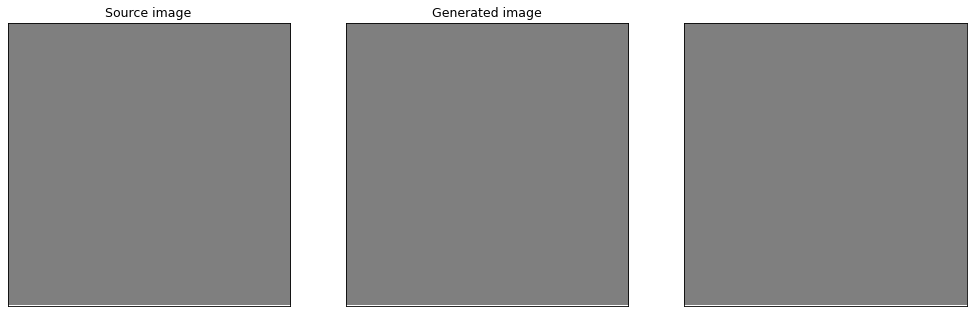

 10%|█         | 10/100 [00:11<01:36,  1.08s/it]

step=10 [-0.03352801501750946, -0.03771150857210159, -0.050834186375141144] ell_infty=69.20832824707031/255


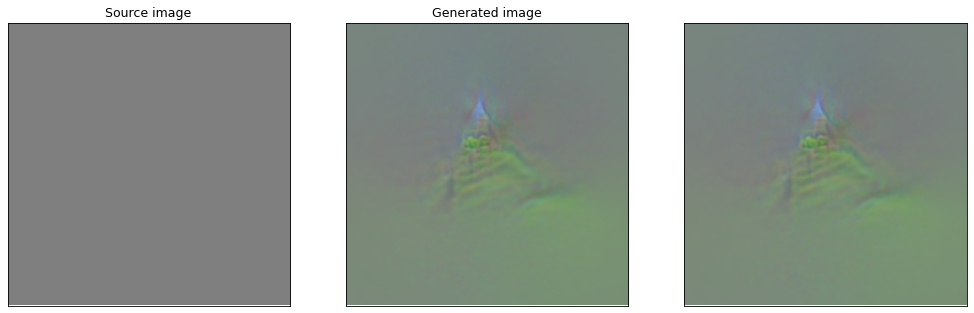

 20%|██        | 20/100 [00:22<01:25,  1.07s/it]

step=20 [-0.07317356765270233, -0.0745241716504097, -0.06726200878620148] ell_infty=76.89131927490234/255


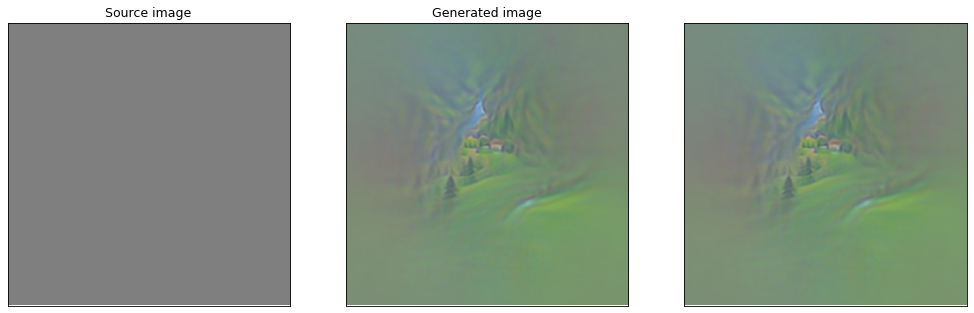

 30%|███       | 30/100 [00:33<01:15,  1.08s/it]

step=30 [-0.08066396415233612, -0.0817040279507637, -0.07030551135540009] ell_infty=89.27661895751953/255


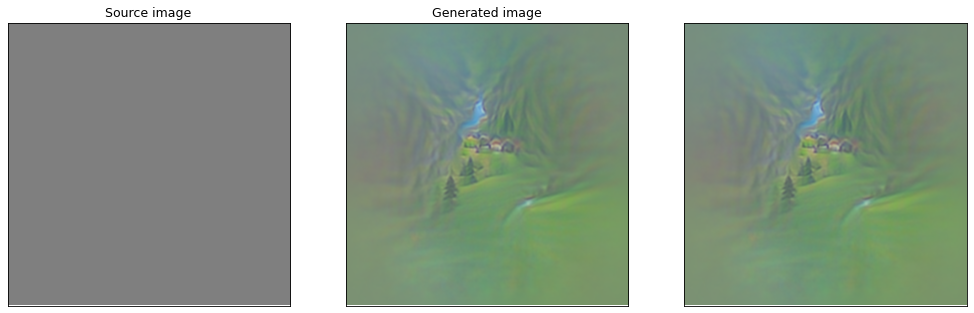

 40%|████      | 40/100 [00:44<01:05,  1.08s/it]

step=40 [-0.08569341897964478, -0.08318013697862625, -0.07231424748897552] ell_infty=94.03580474853516/255


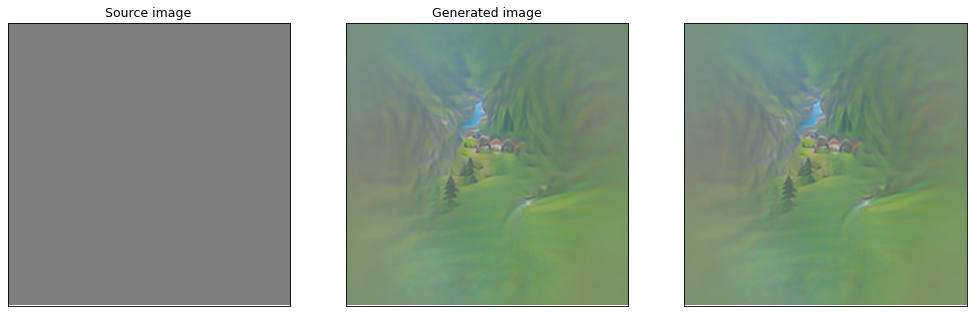

 50%|█████     | 50/100 [00:55<00:54,  1.09s/it]

step=50 [-0.08923648297786713, -0.08615412563085556, -0.07380896806716919] ell_infty=95.43020629882812/255


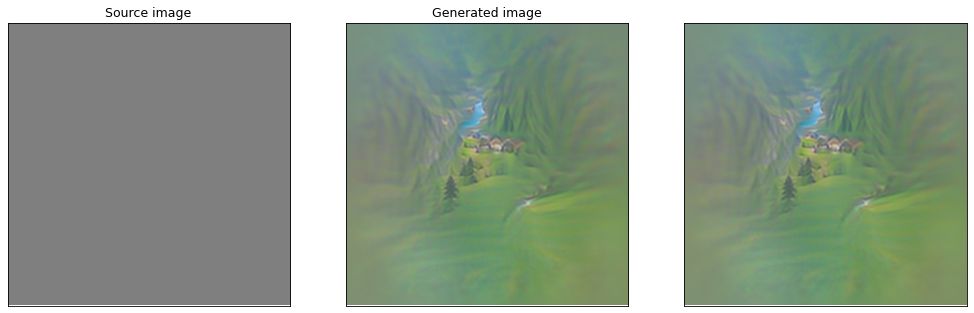

 60%|██████    | 60/100 [01:06<00:43,  1.09s/it]

step=60 [-0.09186248481273651, -0.0880512148141861, -0.07424065470695496] ell_infty=96.5448226928711/255


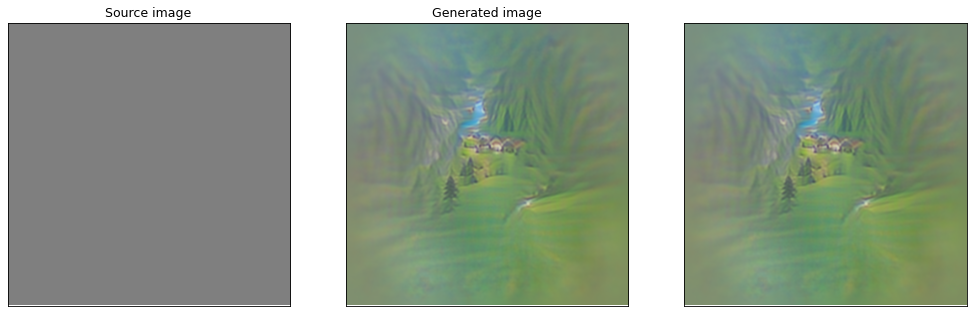

 70%|███████   | 70/100 [01:17<00:32,  1.09s/it]

step=70 [-0.09359901398420334, -0.08988074958324432, -0.07584106177091599] ell_infty=96.78515625/255


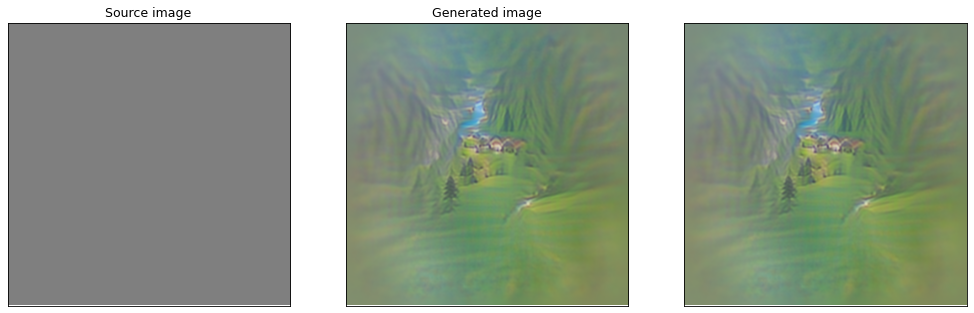

 80%|████████  | 80/100 [01:28<00:21,  1.09s/it]

step=80 [-0.09466080367565155, -0.09061479568481445, -0.0766119733452797] ell_infty=96.85777282714844/255


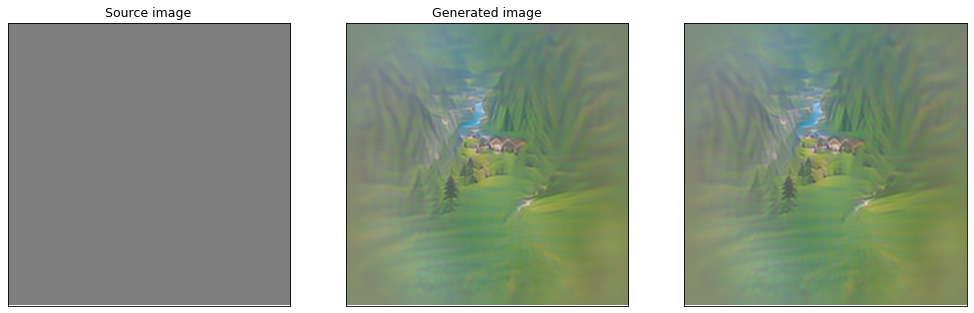

 90%|█████████ | 90/100 [01:39<00:10,  1.09s/it]

step=90 [-0.09645029902458191, -0.09181910753250122, -0.07729817926883698] ell_infty=98.0081558227539/255


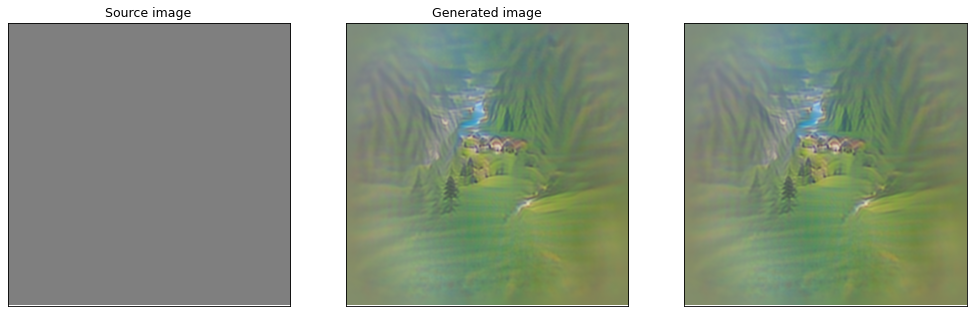

100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


In [17]:
collected_images, components = generate_image(
    models,
    text_weight_pairs,
)

## Resulting image

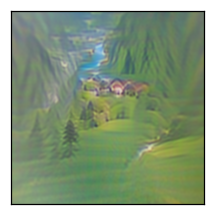

In [18]:
display_images(
    collected_images,
)

### Individual resolutions

tensor([[[0.4789]],

        [[0.5250]],

        [[0.4463]]])
tensor([[[0.5000, 0.4793],
         [0.5029, 0.4967]],

        [[0.5099, 0.4919],
         [0.5167, 0.5065]],

        [[0.5228, 0.4849],
         [0.4923, 0.4463]]])
tensor([[[0.5045, 0.4956, 0.4852, 0.5021],
         [0.5004, 0.5055, 0.4889, 0.4965],
         [0.5068, 0.4906, 0.5032, 0.4986],
         [0.5081, 0.4922, 0.4940, 0.5065]],

        [[0.5037, 0.5089, 0.4944, 0.4991],
         [0.4954, 0.5051, 0.4974, 0.4947],
         [0.5030, 0.5002, 0.5101, 0.4982],
         [0.5062, 0.5056, 0.5022, 0.5009]],

        [[0.5051, 0.5167, 0.4971, 0.4991],
         [0.4967, 0.5155, 0.4902, 0.4923],
         [0.4986, 0.4875, 0.4871, 0.4806],
         [0.4997, 0.5048, 0.4863, 0.4885]]])
tensor([[[0.5005, 0.5013, 0.5010, 0.4964, 0.4964, 0.4972, 0.5006, 0.5011],
         [0.5007, 0.5021, 0.4987, 0.4990, 0.4981, 0.4947, 0.4989, 0.5017],
         [0.5014, 0.4990, 0.5001, 0.5025, 0.4934, 0.4956, 0.4984, 0.5015],
         [0.5007, 0.49

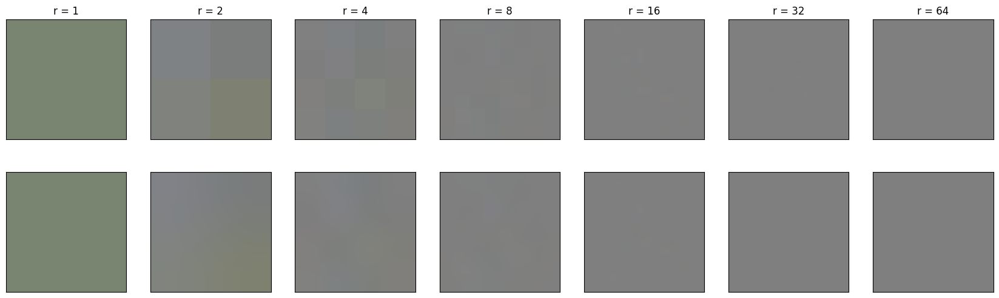

In [19]:
visualize_individual_resolutions(components)

# Task 2 = Generation stability over multiple runs

In [12]:
text_weight_pairs = [
  (1.0, "a beautiful photo of Antelope Canyon’s light beams., detailed"),
  (-0.3,"Optical Character Recognition"),
  (0.3, "octane render, unreal engine, ray tracing, volumetric lighting"),
  (-0.3, "multiple exposure"),
]

Resolutions = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [0.012691067531704903, -0.03762060031294823, -0.12145738303661346] ell_infty=0.0/255


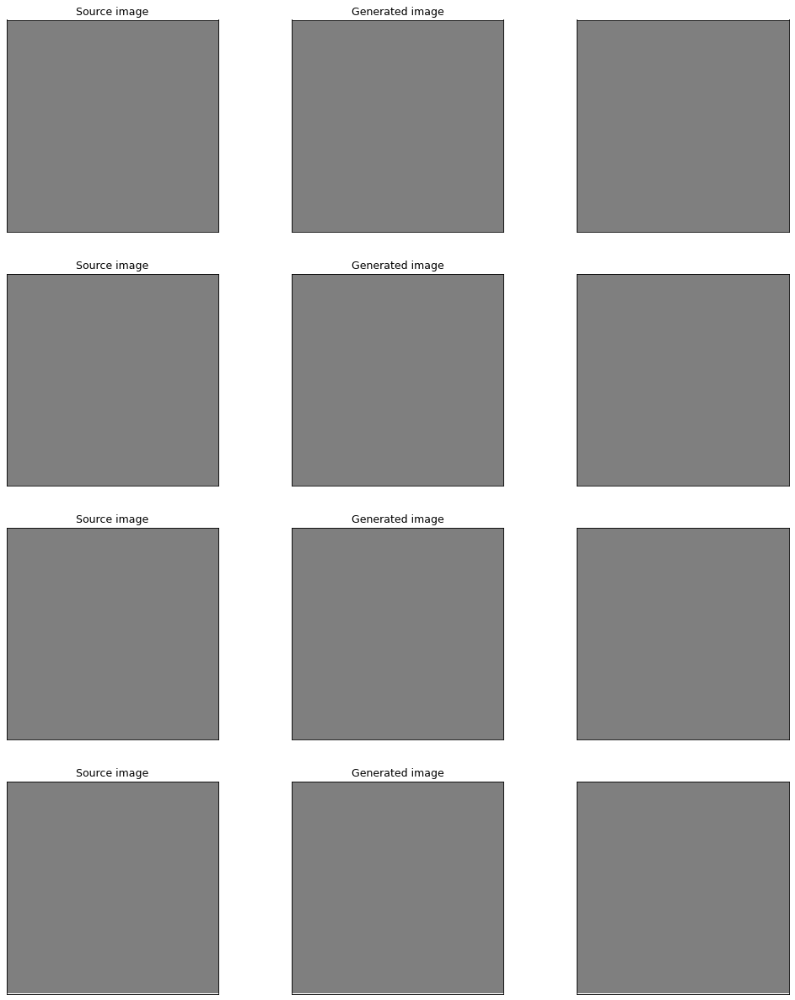

 10%|█         | 10/100 [00:36<05:17,  3.53s/it]

step=10 [-0.17393125593662262, -0.16829007863998413, -0.2117663472890854] ell_infty=93.40232849121094/255


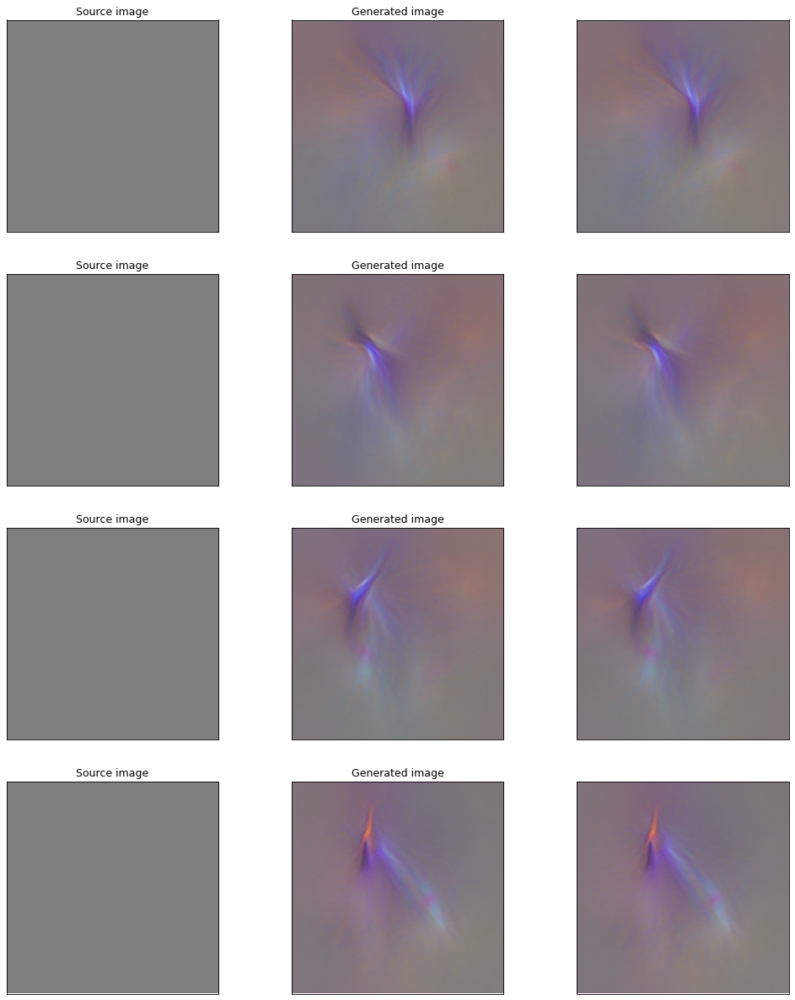

 20%|██        | 20/100 [01:12<04:45,  3.57s/it]

step=20 [-0.23514294624328613, -0.24303027987480164, -0.2895382046699524] ell_infty=102.46156311035156/255


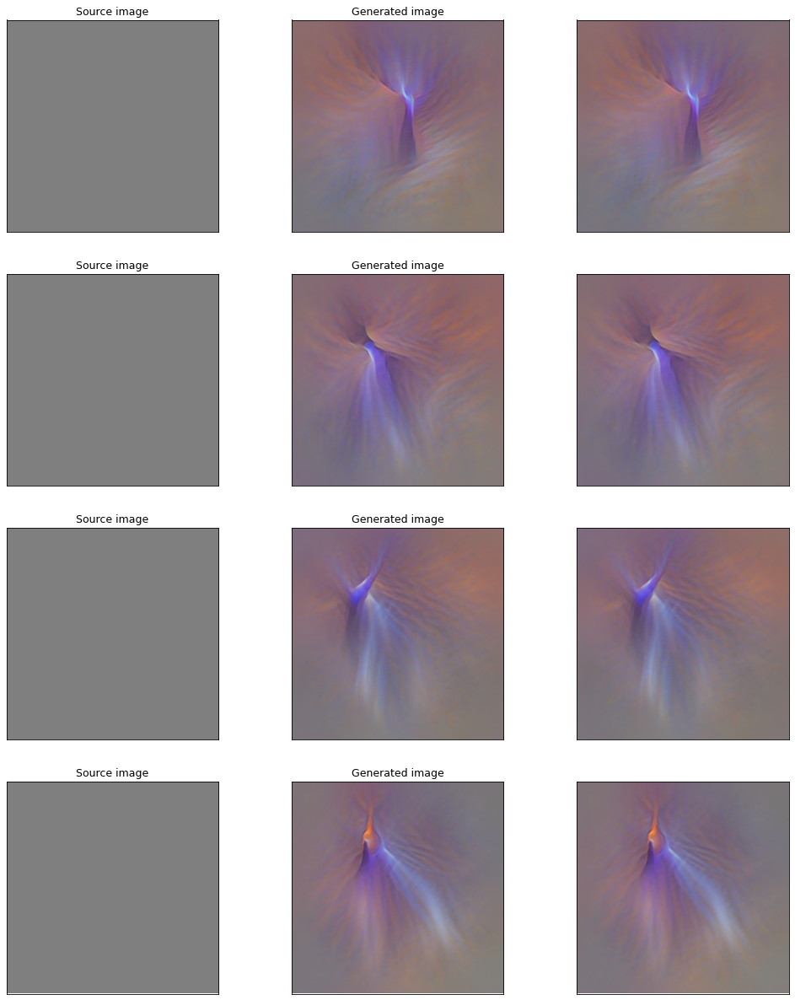

 30%|███       | 30/100 [01:48<04:12,  3.61s/it]

step=30 [-0.29215288162231445, -0.2961796224117279, -0.3202487826347351] ell_infty=106.6725082397461/255


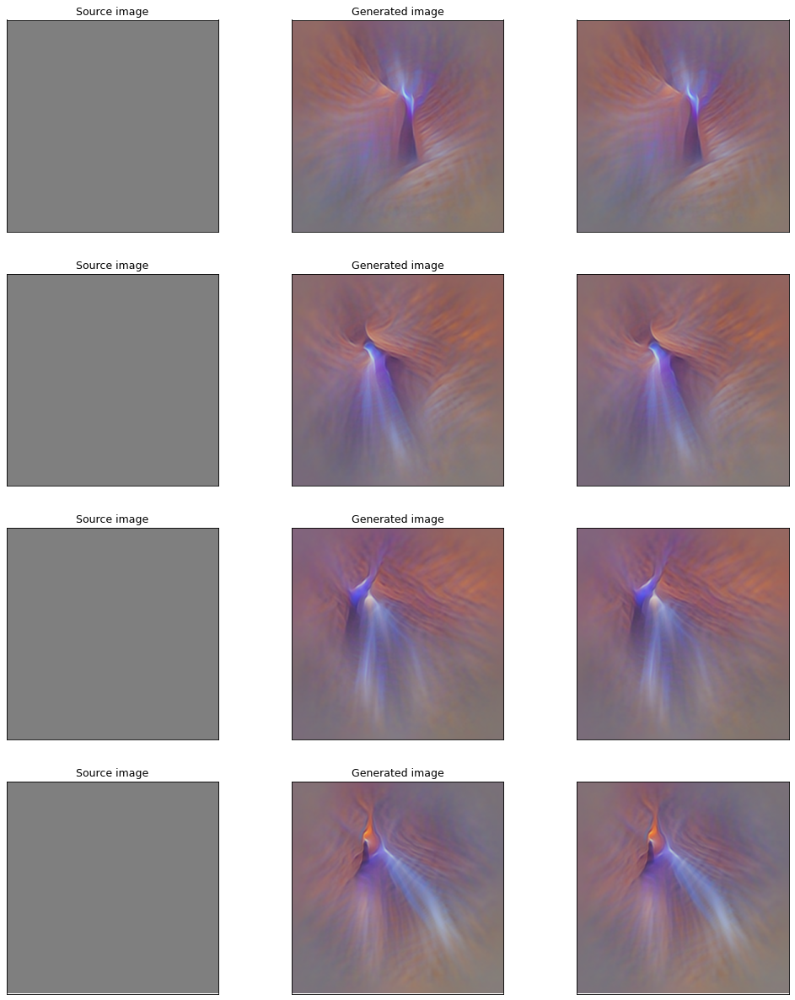

 40%|████      | 40/100 [02:25<03:37,  3.63s/it]

step=40 [-0.31511059403419495, -0.3088962435722351, -0.3348347246646881] ell_infty=109.19828033447266/255


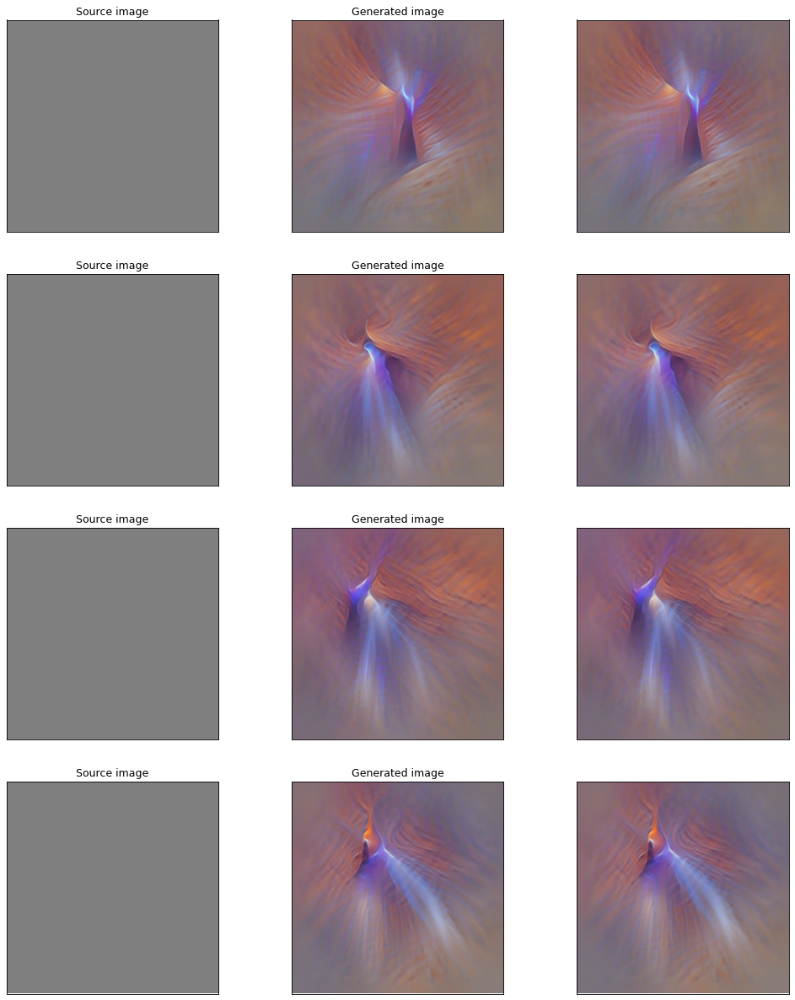

 50%|█████     | 50/100 [03:02<03:02,  3.65s/it]

step=50 [-0.3365110456943512, -0.3223574757575989, -0.3458195924758911] ell_infty=110.67804718017578/255


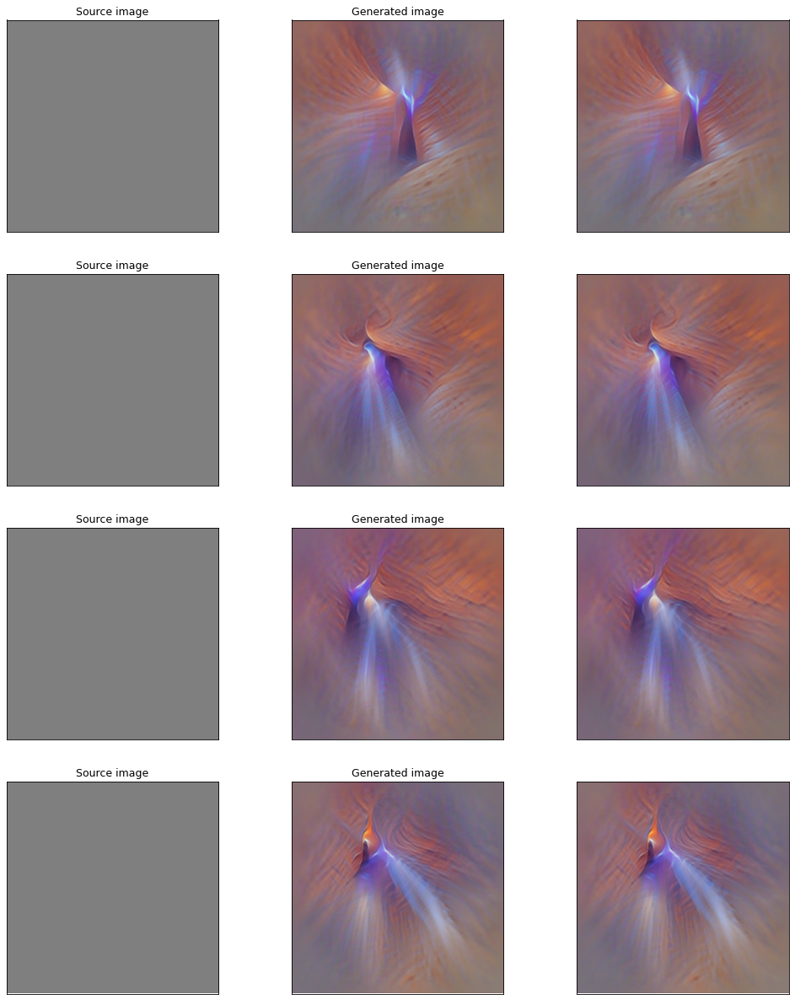

 60%|██████    | 60/100 [03:39<02:26,  3.66s/it]

step=60 [-0.34329819679260254, -0.32847321033477783, -0.35060814023017883] ell_infty=111.83209991455078/255


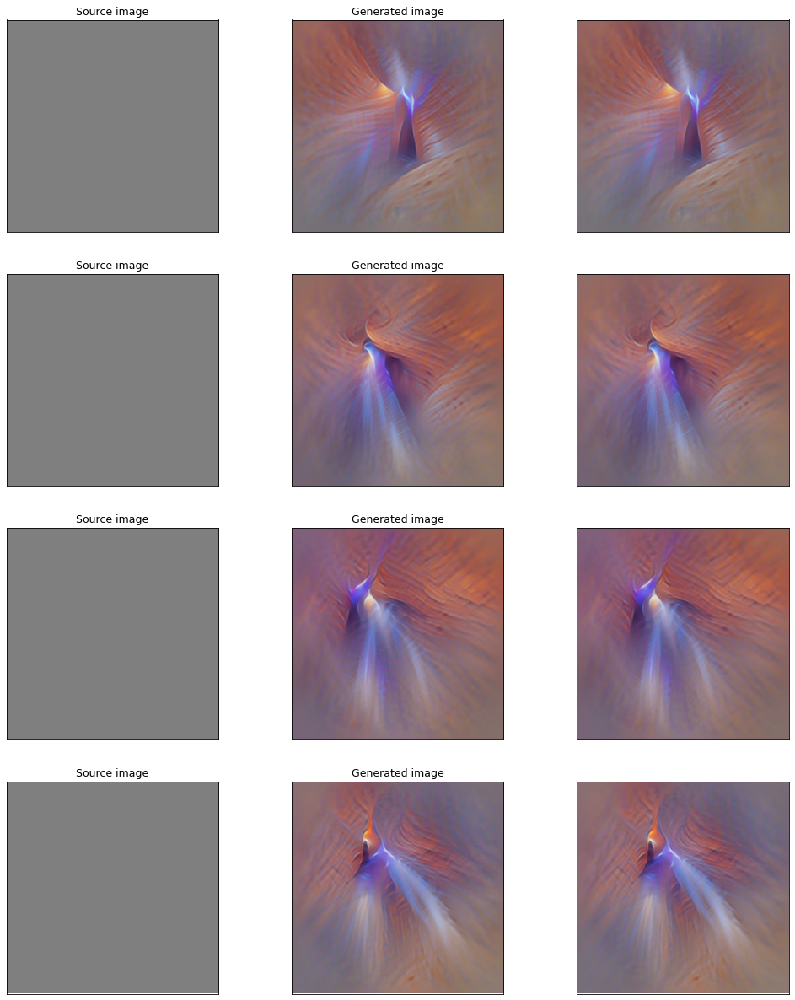

 70%|███████   | 70/100 [04:16<01:50,  3.68s/it]

step=70 [-0.3491401970386505, -0.33998218178749084, -0.35960718989372253] ell_infty=112.84605407714844/255


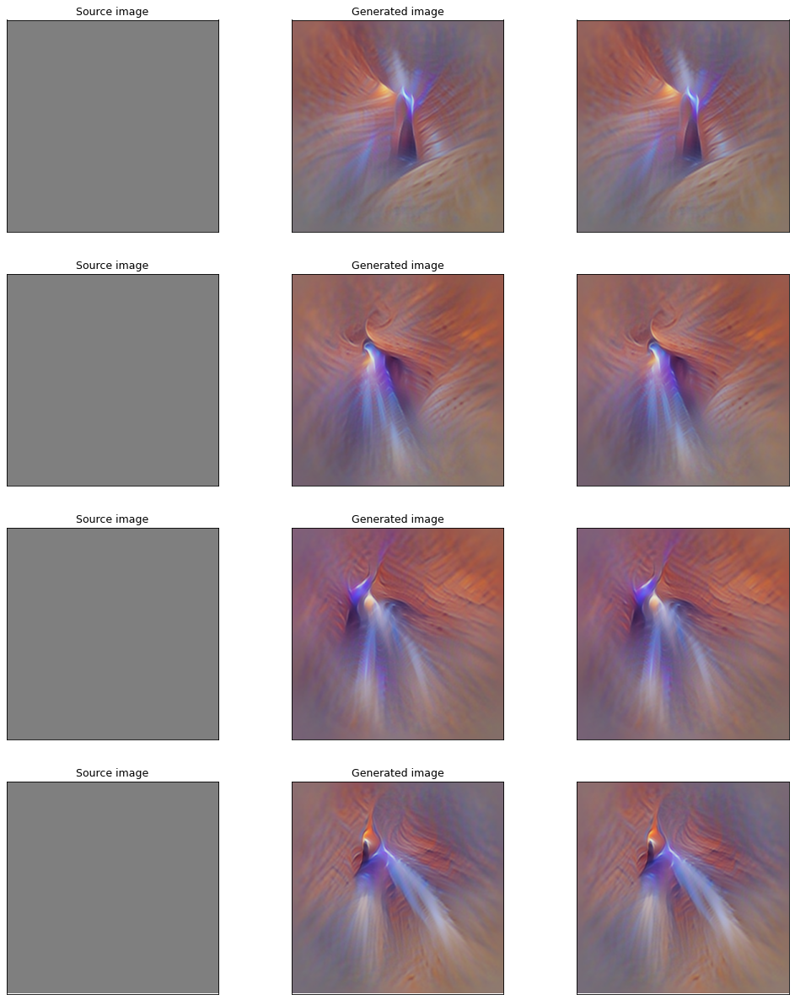

 80%|████████  | 80/100 [04:54<01:13,  3.69s/it]

step=80 [-0.3582473695278168, -0.34549254179000854, -0.3646947741508484] ell_infty=112.58011627197266/255


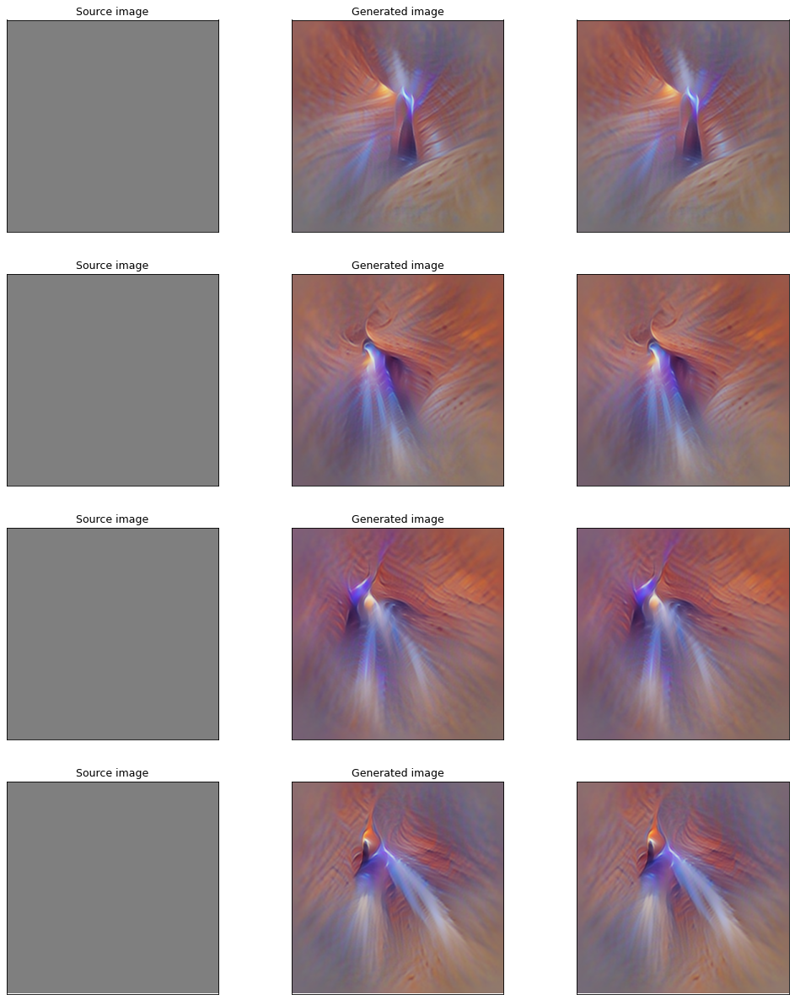

 90%|█████████ | 90/100 [05:31<00:36,  3.68s/it]

step=90 [-0.36359578371047974, -0.3494409918785095, -0.37023794651031494] ell_infty=112.86181640625/255


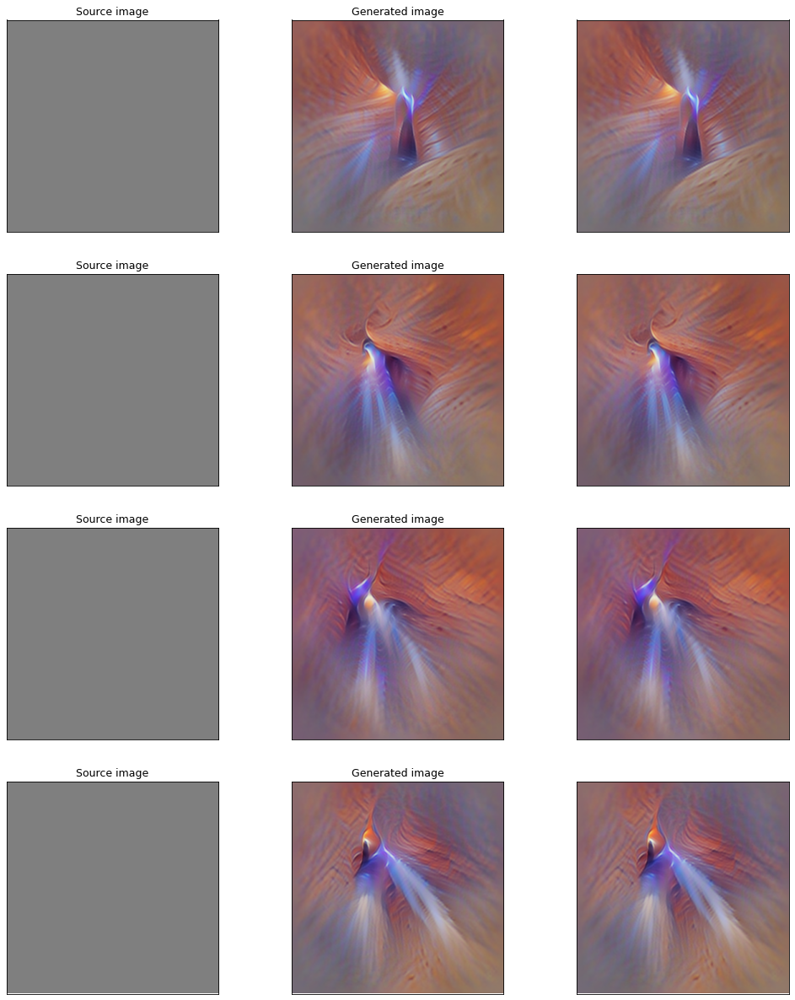

100%|██████████| 100/100 [06:08<00:00,  3.69s/it]


In [13]:
collected_images, components = generate_image(
  models,
  text_weight_pairs,
  num_generations=4,
)

## Resulting images

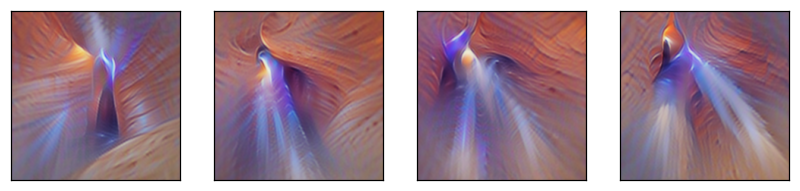

In [14]:
display_images(
    collected_images,
)

# Task 3 = "Style" transfer

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, image_paths):
        self.image_paths = image_paths

        self.transform = transforms.Compose([
            transforms.Resize(224),  # Resize shorter side to 224, maintain aspect ratio
            transforms.CenterCrop(224),  # Crop the center 224x224
            transforms.ToTensor(),  # Convert to tensor and normalize to [0,1]
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        tensor = self.transform(image)
        return tensor

def load_images(image_paths, batch_size=32):
    """
    Load images from list of paths and return batched tensor

    Args:
        image_paths (list): List of paths to image files
        batch_size (int): Size of batches to return

    Returns:
        DataLoader that yields tensors of shape [batch_size, 3, 224, 224]
    """
    dataset = ImageDataset(image_paths)
    dataloader = DataLoader(dataset,
                          batch_size=batch_size,
                          shuffle=False,
                          num_workers=4)
    return dataloader

### Starting image

In [ ]:
!wget https://www.noesnest.com/wp-content/uploads/sites/14/2020/03/san-francisco-at-night.jpg -O start_image.jpg

image_paths = [
    "start_image.jpg"
]

loader = load_images(image_paths)

batch = next(iter(loader))
starting_image = batch

large_res = 336

eps = 0.1 # to offset the image from the ends of the brigthness range
starting_image = starting_image * (1-2*eps) + eps

# adding padding to make it 336 size in total (not resizing, padding)
starting_image = F.pad(starting_image, ((large_res-starting_image.shape[2])//2, (large_res-starting_image.shape[2])//2, (large_res-starting_image.shape[3])//2, (large_res-starting_image.shape[3])//2), "constant", 0.5)#1-eps)

--2025-03-31 16:44:16--  https://www.noesnest.com/wp-content/uploads/sites/14/2020/03/san-francisco-at-night.jpg
Resolving www.noesnest.com (www.noesnest.com)... 8.29.155.199
Connecting to www.noesnest.com (www.noesnest.com)|8.29.155.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 744386 (727K) [image/jpeg]
Saving to: ‘start_image.jpg’

start_image.jpg     100%[===================>] 726.94K   614KB/s    in 1.2s    

2025-03-31 16:44:18 (614 KB/s) - ‘start_image.jpg’ saved [744386/744386]



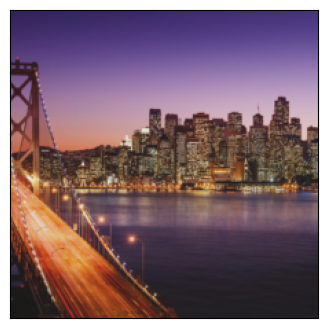

In [ ]:
offset = (large_res - 224) // 2
plt.figure(figsize=(4 * starting_image.shape[0], 4))
for i in range(starting_image.shape[0]):
    plt.subplot(1, starting_image.shape[0], i + 1)
    img_show(starting_image[i][:, offset:-offset, offset:-offset])

plt.show()

### "Style" guiding image

In [ ]:
!wget https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg -O guiding_image1.png

image_paths = [
    "guiding_image1.png"
]

loader = load_images(image_paths)
batch = next(iter(loader))
guiding_image = batch

--2025-03-31 16:53:10--  https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/970px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 185.15.59.240, 2a02:ec80:300:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|185.15.59.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 356804 (348K) [image/jpeg]
Saving to: ‘guiding_image1.png’

guiding_image1.png  100%[===================>] 348.44K   606KB/s    in 0.6s    

2025-03-31 16:53:12 (606 KB/s) - ‘guiding_image1.png’ saved [356804/356804]



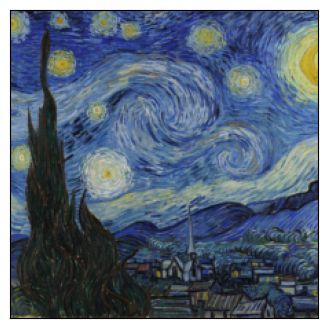

In [ ]:
plt.figure(figsize=(4 * guiding_image.shape[0], 4))
for i in range(guiding_image.shape[0]):
    plt.subplot(1, guiding_image.shape[0], i + 1)
    img_show(guiding_image[i])

plt.show()

### Combining the two

resolutions=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [-0.4025365710258484, -0.3625645041465759, -0.5902557373046875] ell_infty=0.0/255


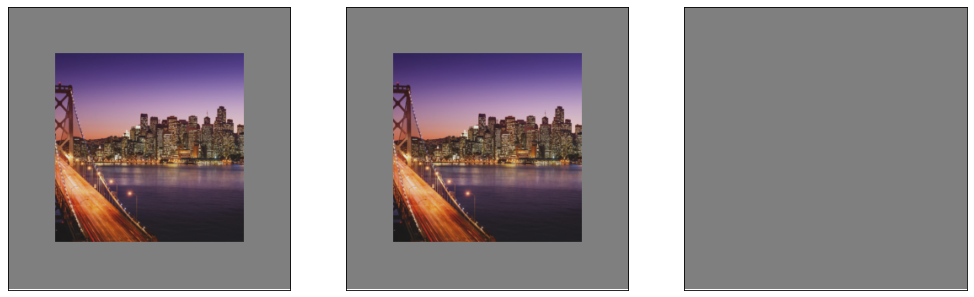

 10%|█         | 10/100 [00:04<00:42,  2.11it/s]

step=10 [-0.877316951751709, -0.8672468066215515, -0.89593505859375] ell_infty=148.4/255


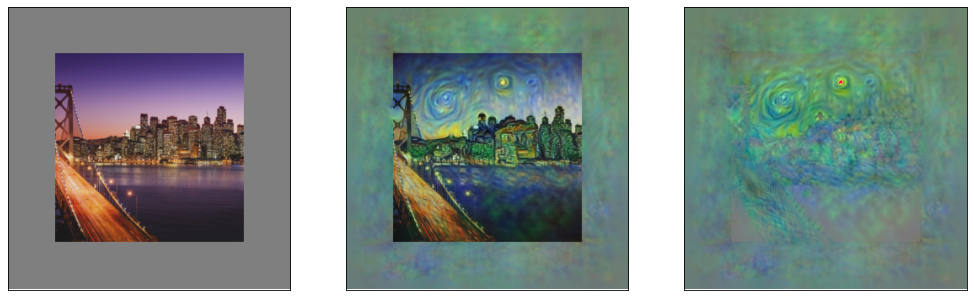

 20%|██        | 20/100 [00:09<00:38,  2.10it/s]

step=20 [-0.9313379526138306, -0.926281213760376, -0.9387054443359375] ell_infty=147.6/255


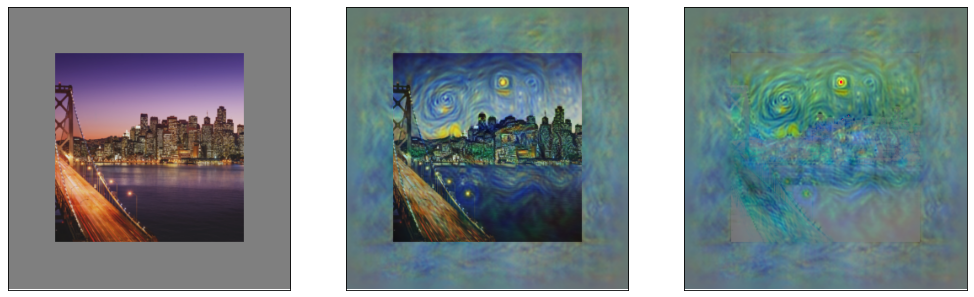

 30%|███       | 30/100 [00:14<00:33,  2.10it/s]

step=30 [-0.9477707743644714, -0.9405252933502197, -0.956298828125] ell_infty=149.1/255


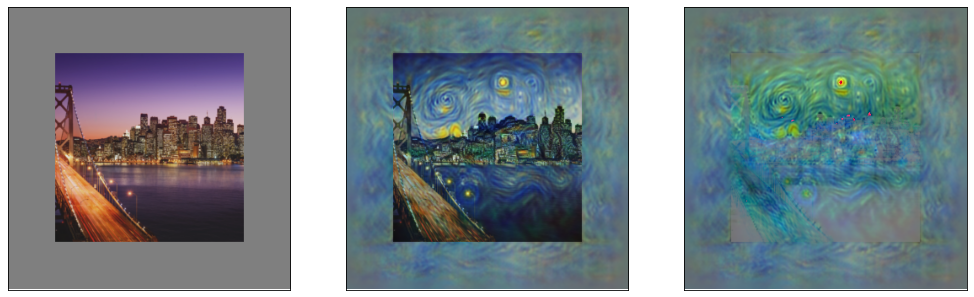

 40%|████      | 40/100 [00:19<00:28,  2.10it/s]

step=40 [-0.9559736847877502, -0.9505527019500732, -0.958831787109375] ell_infty=154.2/255


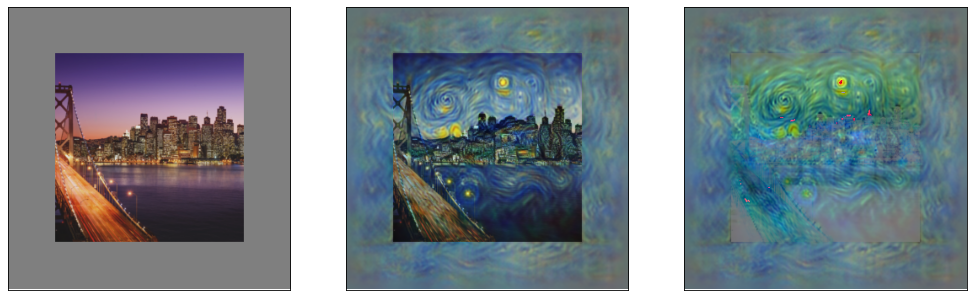

 50%|█████     | 50/100 [00:24<00:23,  2.10it/s]

step=50 [-0.9590692520141602, -0.9541745185852051, -0.9635162353515625] ell_infty=154.5/255


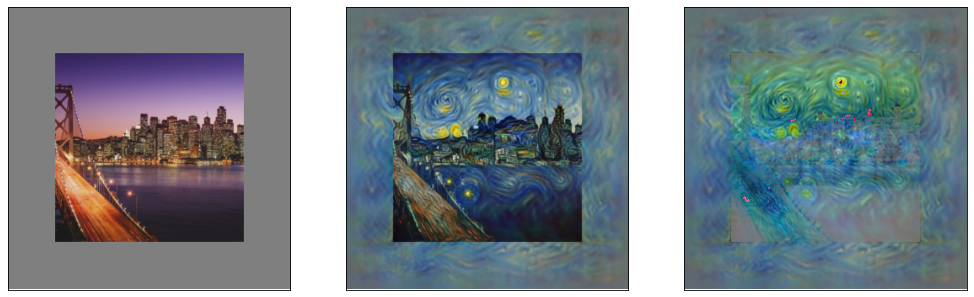

 60%|██████    | 60/100 [00:29<00:19,  2.10it/s]

step=60 [-0.9615774750709534, -0.9609918594360352, -0.9654388427734375] ell_infty=155.4/255


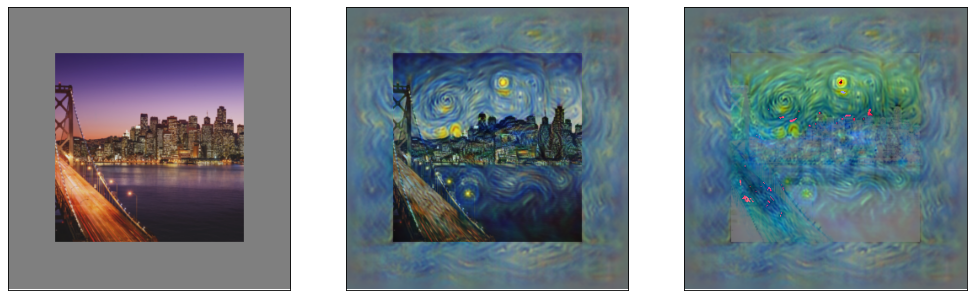

 70%|███████   | 70/100 [00:33<00:14,  2.10it/s]

step=70 [-0.9644178152084351, -0.9648393392562866, -0.96875] ell_infty=155.4/255


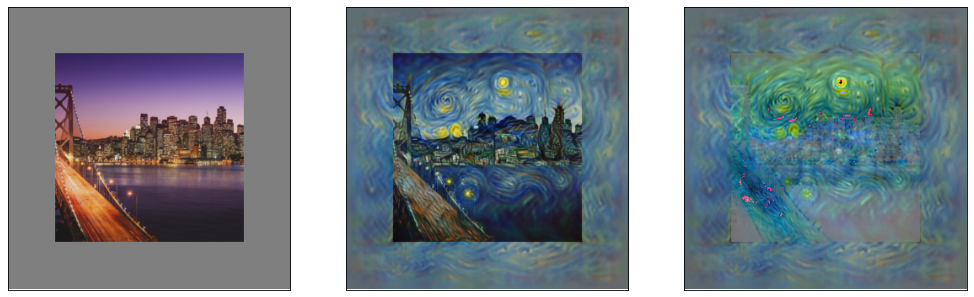

 80%|████████  | 80/100 [00:38<00:09,  2.10it/s]

step=80 [-0.9674394130706787, -0.9656273126602173, -0.96649169921875] ell_infty=156.3/255


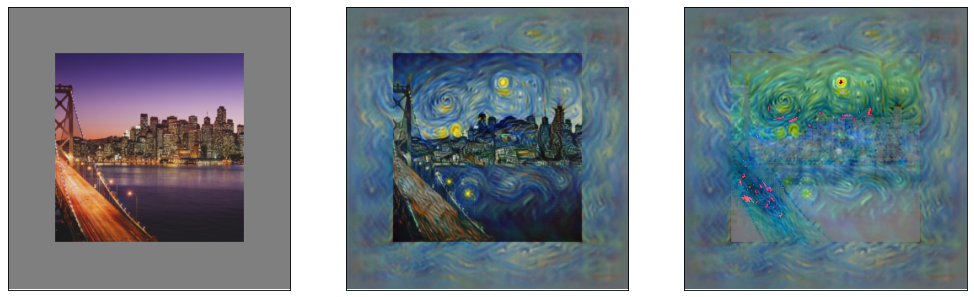

 90%|█████████ | 90/100 [00:43<00:04,  2.10it/s]

step=90 [-0.9674026370048523, -0.9673494100570679, -0.9698028564453125] ell_infty=156.5/255


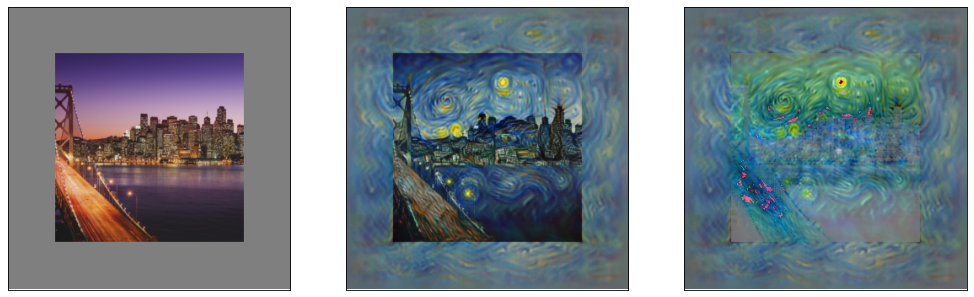

100%|██████████| 100/100 [00:48<00:00,  2.06it/s]


In [ ]:
collected_images = generate_image(
  models,
  text_weight_pairs = [],
  guiding_images = guiding_image,
  source_image = starting_image.detach().cpu().numpy(),
)

## Resulting image

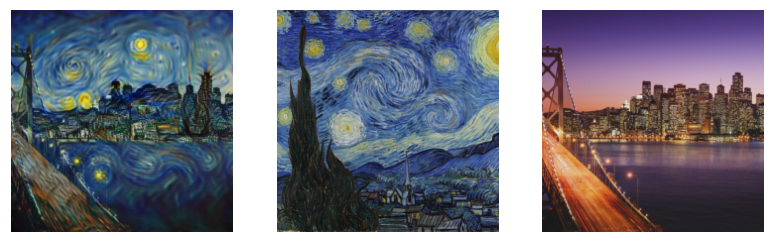

In [ ]:
display_images(
    collected_images,
    guiding_image = guiding_image,
    starting_image = starting_image
)

# Task 4 = Reconstructing an image from its embedding

## Getting the image to reconstruct

In [ ]:
!wget https://www.rmg.co.uk/sites/default/files/styles/full_width_1440/public/Henry%20VIII.jpg -O guiding_image1.png

image_paths = [
    "guiding_image1.png"
]

loader = load_images(image_paths)
batch = next(iter(loader))
guiding_image = batch

--2025-03-31 16:54:58--  https://www.rmg.co.uk/sites/default/files/styles/full_width_1440/public/Henry%20VIII.jpg
Resolving www.rmg.co.uk (www.rmg.co.uk)... 23.185.0.2, 2620:12a:8001::2, 2620:12a:8000::2
Connecting to www.rmg.co.uk (www.rmg.co.uk)|23.185.0.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 147318 (144K) [image/jpeg]
Saving to: ‘guiding_image1.png’

guiding_image1.png  100%[===================>] 143.87K   420KB/s    in 0.3s    

2025-03-31 16:54:59 (420 KB/s) - ‘guiding_image1.png’ saved [147318/147318]



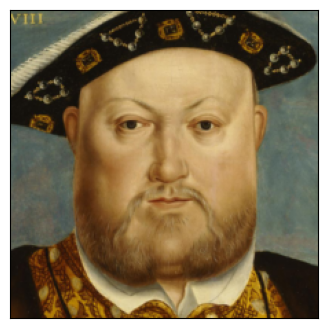

In [ ]:
plt.figure(figsize=(4 * guiding_image.shape[0], 4))
for i in range(guiding_image.shape[0]):
    plt.subplot(1, guiding_image.shape[0], i + 1)
    img_show(guiding_image[i])

plt.show()

## Reconstruction the image

resolutions=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 

  0%|          | 0/100 [00:00<?, ?it/s]

step=0 [-0.09335462749004364, -0.078021340072155, -0.1321866512298584] ell_infty=0.0/255


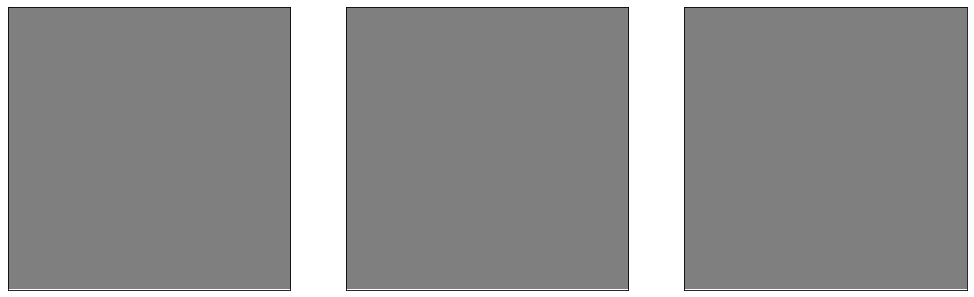

 10%|█         | 10/100 [00:04<00:42,  2.11it/s]

step=10 [-0.13763907551765442, -0.11123492568731308, -0.1457267701625824] ell_infty=68.2/255


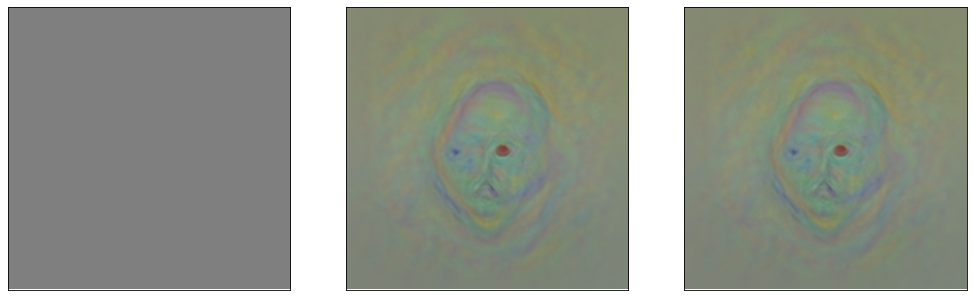

 20%|██        | 20/100 [00:09<00:38,  2.10it/s]

step=20 [-0.28080278635025024, -0.2775934040546417, -0.3051096796989441] ell_infty=88.2/255


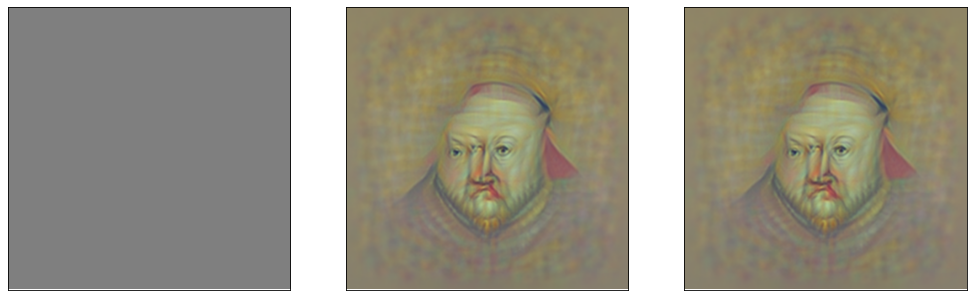

 30%|███       | 30/100 [00:14<00:33,  2.11it/s]

step=30 [-0.30072396993637085, -0.2984245717525482, -0.31675392389297485] ell_infty=89.4/255


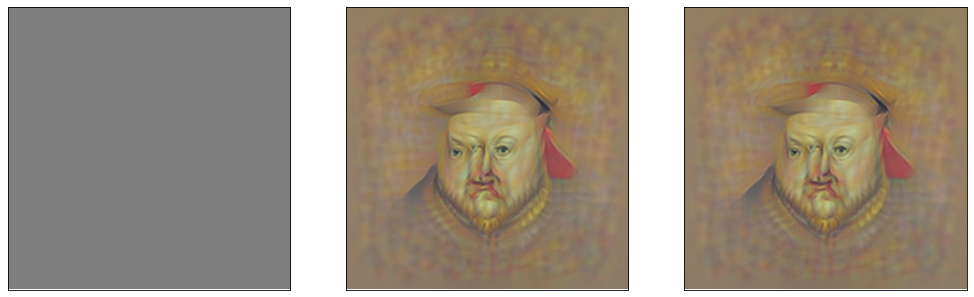

 40%|████      | 40/100 [00:19<00:28,  2.11it/s]

step=40 [-0.3090893626213074, -0.3026358485221863, -0.3186849057674408] ell_infty=94.2/255


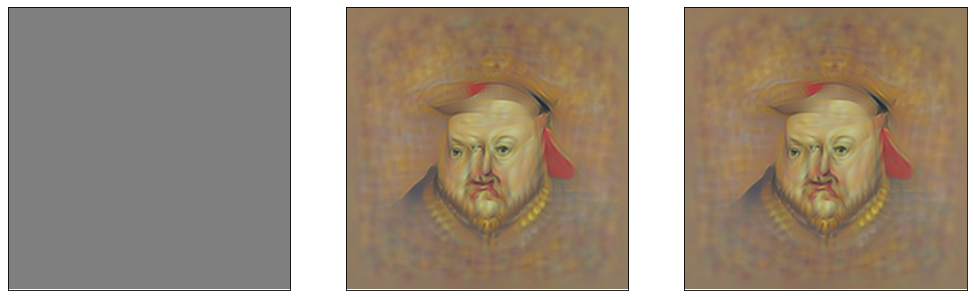

 50%|█████     | 50/100 [00:23<00:23,  2.10it/s]

step=50 [-0.30977898836135864, -0.3056091070175171, -0.3200225830078125] ell_infty=98.1/255


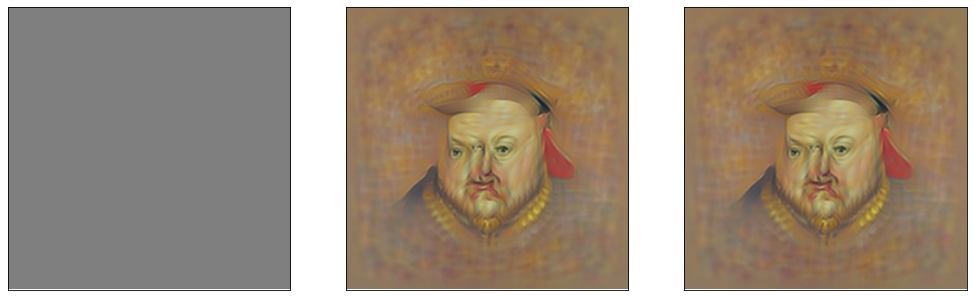

 60%|██████    | 60/100 [00:28<00:19,  2.10it/s]

step=60 [-0.31431716680526733, -0.3091493844985962, -0.3232055902481079] ell_infty=102.4/255


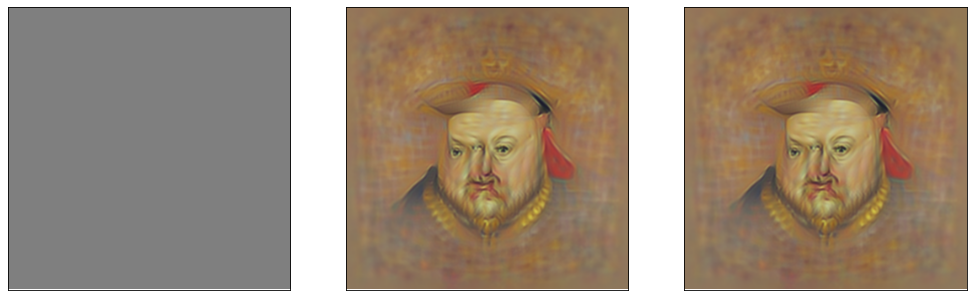

 70%|███████   | 70/100 [00:33<00:14,  2.11it/s]

step=70 [-0.3144318461418152, -0.30919796228408813, -0.3234820067882538] ell_infty=105.1/255


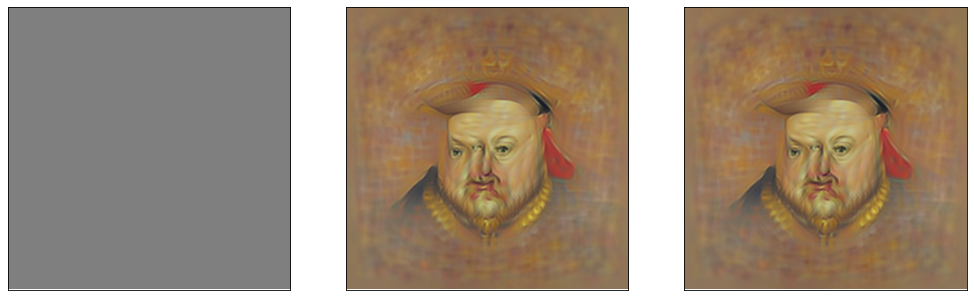

 80%|████████  | 80/100 [00:38<00:09,  2.10it/s]

step=80 [-0.31718289852142334, -0.3108716607093811, -0.3245943784713745] ell_infty=107.7/255


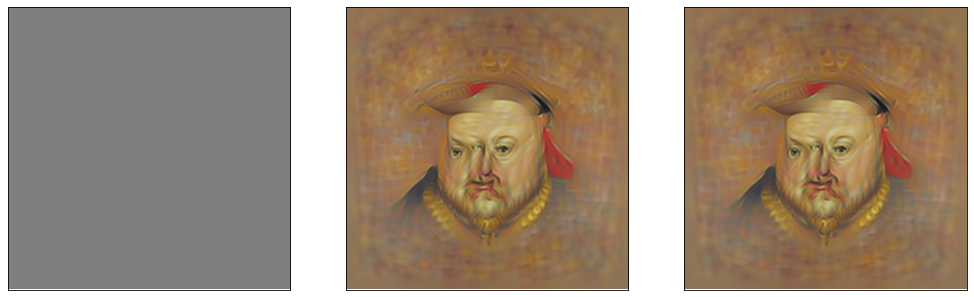

 90%|█████████ | 90/100 [00:43<00:04,  2.11it/s]

step=90 [-0.31669411063194275, -0.31166115403175354, -0.3246750235557556] ell_infty=109.2/255


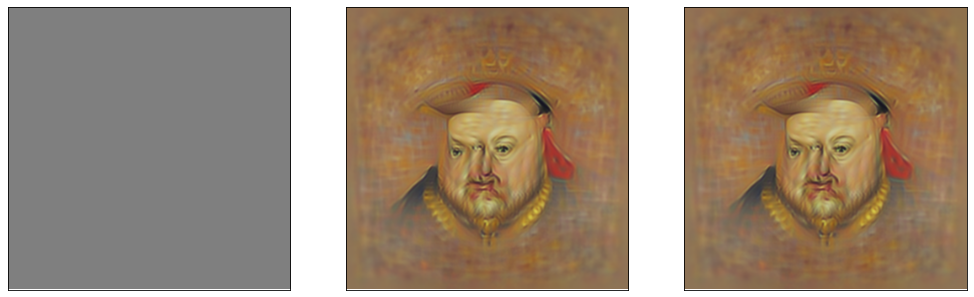

100%|██████████| 100/100 [00:48<00:00,  2.08it/s]


In [ ]:
# helping the reconstruction with a content agnostic set of prompts
text_weight_pairs = [
  (0.6,"cohesive single subject"),
  (-0.6, "multiple exposure"),
]

collected_images = generate_image(
  models,
  text_weight_pairs = text_weight_pairs,
  guiding_images = guiding_image,
)

## Resulting image

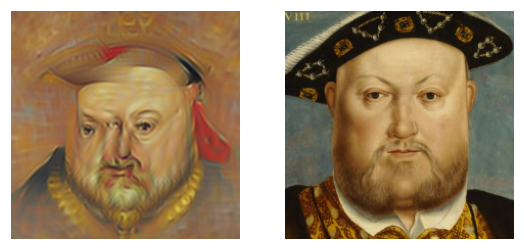

In [ ]:
display_images(
    collected_images,
    guiding_image = guiding_image,
    show_guiding_image = True,
)